#**How to Train YOLO11 Object Detection Model on a Custom Dataset**

Data: https://universe.roboflow.com/project-uyrxf/ppe_detection-v1x3l/dataset/1#

In [8]:
!nvidia-smi

Tue Mar 18 10:13:29 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**Step 01 # Install the Ultralytics Package**

In [9]:
!pip install ultralytics

**Step 02 # Import All the Requried Libraries**

In [10]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.92 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.4/112.6 GB disk)


In [11]:
from ultralytics import YOLO
from IPython.display import Image

**Step # 03 Download Dataset from Roboflow**

In [12]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dyY68vxYBl3amcowxpSw")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
version = project.version(1)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...


In [13]:
dataset.location

'/content/PPE_Detection-1'

In [28]:
cat /content/PPE_Detection-1/data.yaml

train: /content/PPE_Detection-1/train/images
val: /content/PPE_Detection-1/valid/images
test: /content/PPE_Detection-1/test/images

nc: 7
names: ['Dust Mask', 'Eye Wear', 'Glove', 'Jacket', 'Protective Boots', 'Protective Helmet', 'Shield']

roboflow:
  workspace: project-uyrxf
  project: ppe_detection-v1x3l
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/project-uyrxf/ppe_detection-v1x3l/dataset/1


**Step # 04 Train YOLO11 Model on a Custom Dataset**

In [29]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=50 imgsz=640

Ultralytics 8.3.92 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/PPE_Detection-1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, s

**Step # 05 Examine Training Results**

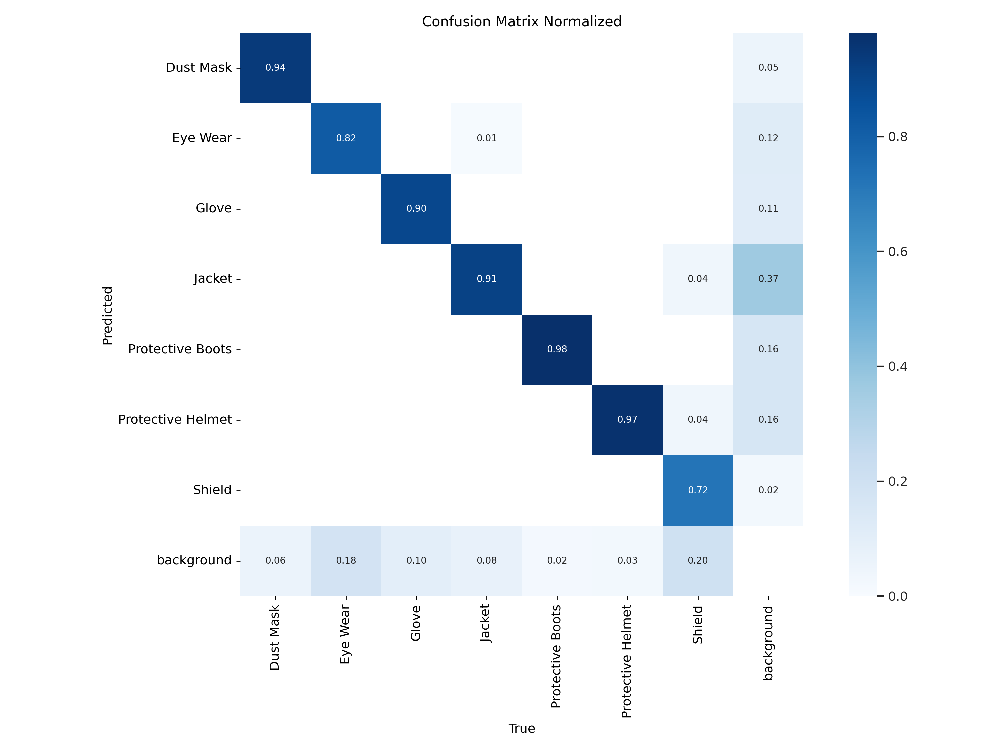

In [38]:
Image("/content/runs/detect/train4/confusion_matrix_normalized.png", width=600)

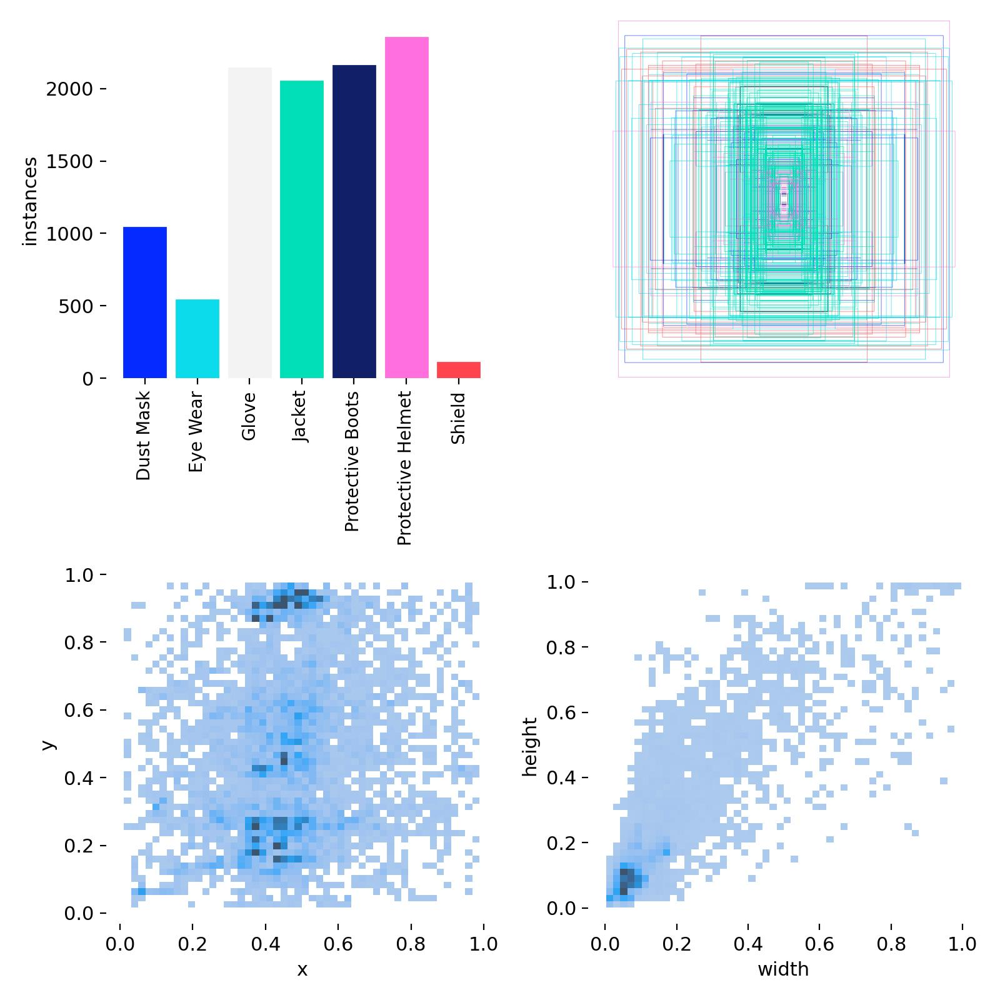

In [39]:
Image("/content/runs/detect/train4/labels.jpg", width=600)

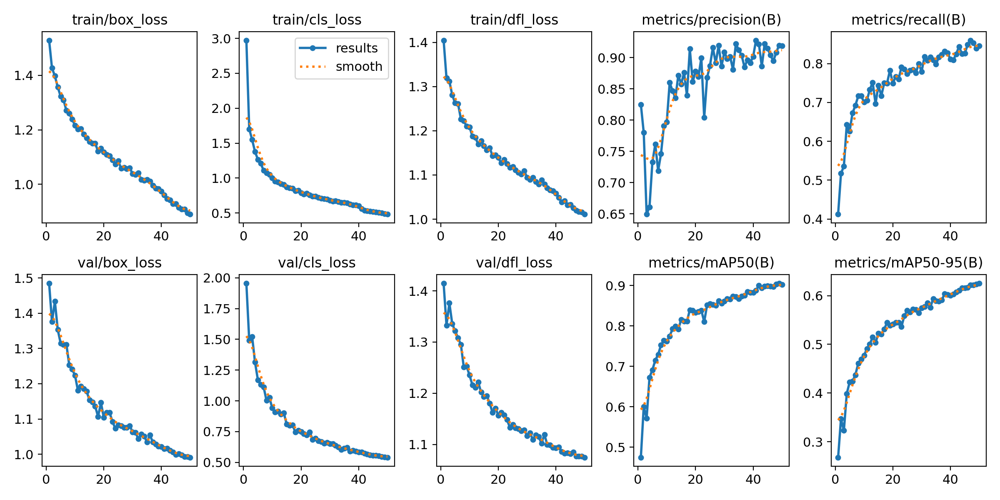

In [40]:
Image("/content/runs/detect/train4/results.png", width=600)

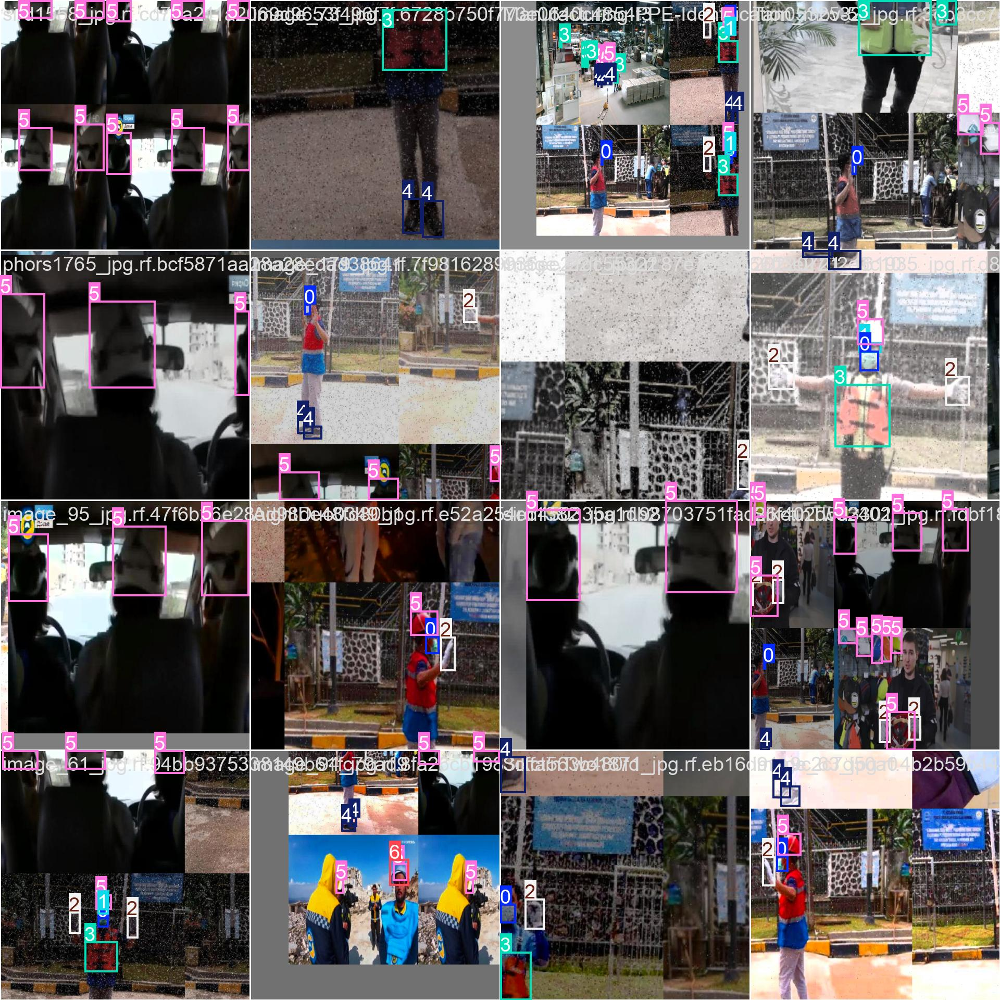

In [41]:
Image("/content/runs/detect/train4/train_batch0.jpg", width=600)

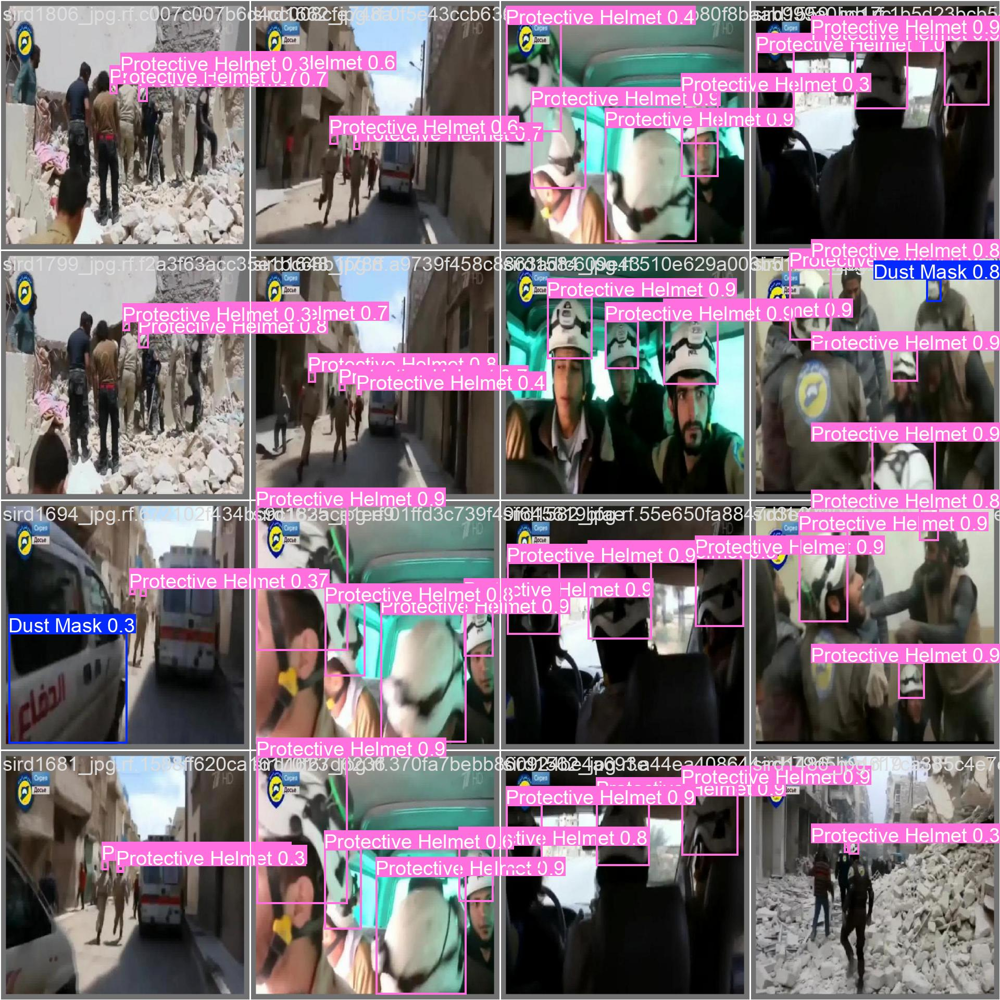

In [42]:
Image("/content/runs/detect/train4/val_batch0_pred.jpg", width=600)

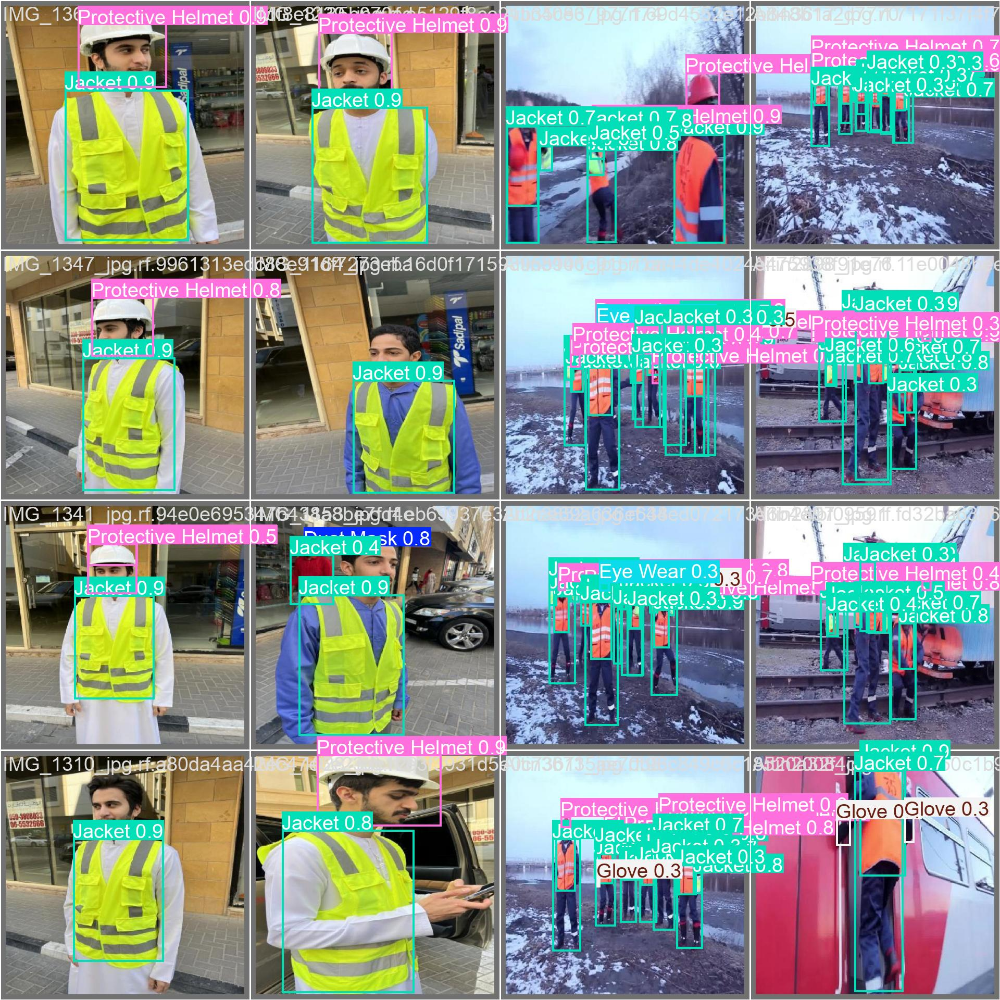

In [43]:
Image("/content/runs/detect/train4/val_batch1_pred.jpg", width=600)

**Step # 07  Validate Fine-Tuned Model**

In [44]:
!yolo task=detect mode=val model="/content/runs/detect/train4/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.92 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/PPE_Detection-1/valid/labels.cache... 649 images, 0 backgrounds, 0 corrupt: 100% 649/649 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 41/41 [00:08<00:00,  4.58it/s]
                   all        649       3126      0.918      0.845      0.902      0.625
             Dust Mask        301        311      0.972      0.893      0.954      0.673
              Eye Wear        148        149      0.867      0.718      0.808      0.459
                 Glove        354        644      0.958      0.878      0.943      0.673
                Jacket        364        607      0.905      0.875      0.938      0.724
      Protective Boots        299        610       0.96      0.957      0.981      0.696
     Protective Helmet        413        780  

**Step # 08 Inference with Custom Model on Images**

In [45]:
import os
print(os.path.exists("/content/runs/detect/train4/weights/best.pt"))


True


In [46]:
!yolo task=detect mode=predict model="/content/runs/detect/train4/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.92 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/325 /content/PPE_Detection-1/test/images/000446_jpg.rf.5ea7ca6bde68eb546e8c3dcd1c0fd6d5.jpg: 640x640 1 Dust Mask, 1 Glove, 2 Protective Helmets, 12.7ms
image 2/325 /content/PPE_Detection-1/test/images/20220721_161946_jpg.rf.4ff1543edb0405f57fb590d5dcb284b6.jpg: 640x640 (no detections), 10.2ms
image 3/325 /content/PPE_Detection-1/test/images/20220721_162015_jpg.rf.ee54ba7d79baa065a7cfc4666f0fd024.jpg: 640x640 1 Dust Mask, 9.0ms
image 4/325 /content/PPE_Detection-1/test/images/20220721_162036_jpg.rf.9d32aa23505a54eff5555d9b667bb597.jpg: 640x640 1 Dust Mask, 1 Glove, 8.7ms
image 5/325 /content/PPE_Detection-1/test/images/20220721_162308_jpg.rf.2f8d1ad4716998b9fc123d94dce4d8b0.jpg: 640x640 1 Dust Mask, 2 Eye Wears, 8.8ms
image 6/325 /content/PPE_Detection-1/test/images/20220721_162435_jpg.rf.f36f898409158c65a23c0604535

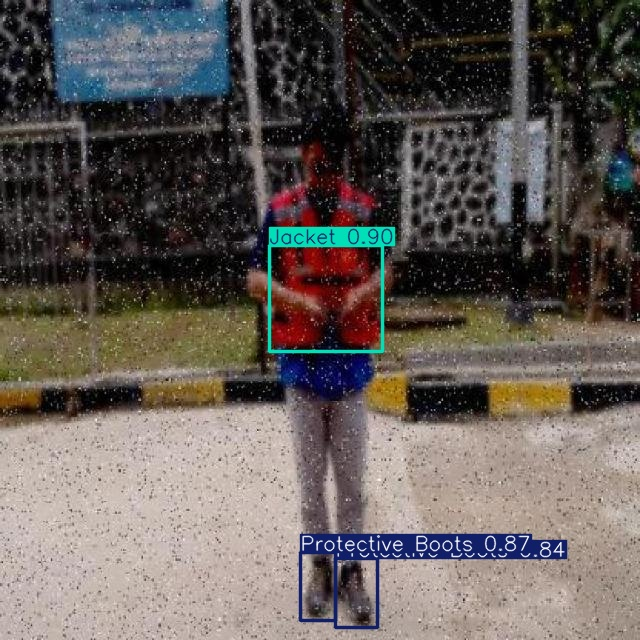

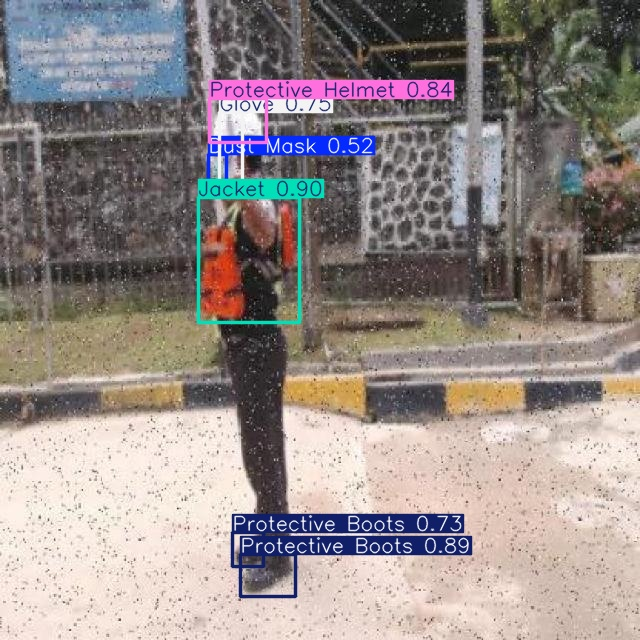

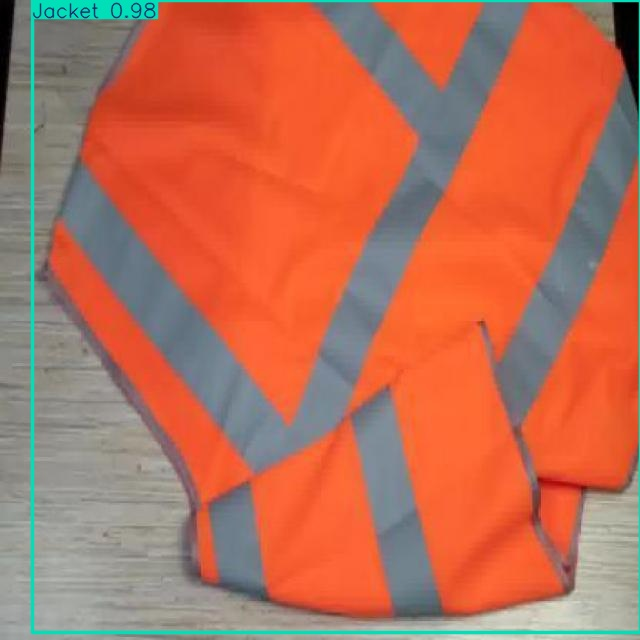

In [47]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [48]:
!gdown "https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t
To: /content/image2.jpg
100% 77.7k/77.7k [00:00<00:00, 130MB/s]


In [50]:
!yolo task=detect mode=predict model= "/content/runs/detect/train4/weights/best.pt" conf=0.25 source=image2.jpg save=True

Ultralytics 8.3.92 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/image2.jpg: 640x640 6 Jackets, 6 Protective Bootss, 3 Protective Helmets, 12.0ms
Speed: 2.8ms preprocess, 12.0ms inference, 170.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


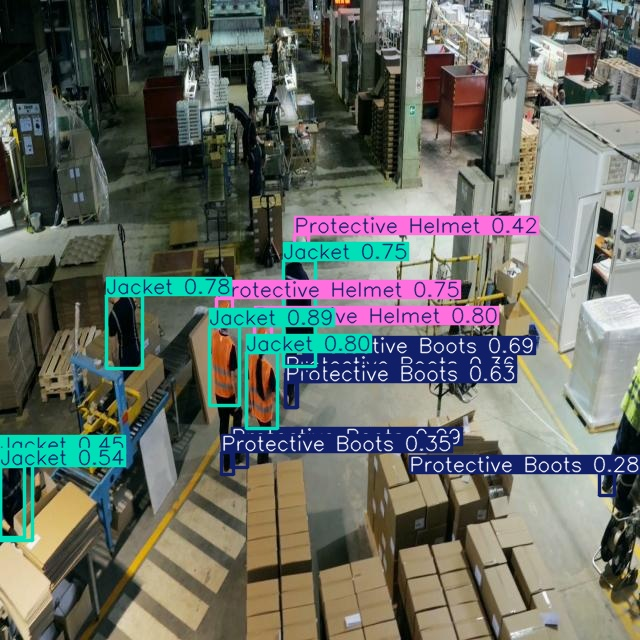

In [51]:
Image("/content/runs/detect/predict2/image2.jpg", width=600)

**Step # 08 Inference with Custom Model on Videos**

In [52]:
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t
To: /content/PPE_Part1.mp4
100% 14.2M/14.2M [00:00<00:00, 20.7MB/s]


In [53]:
!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t
To: /content/PPE_Part2.mp4
100% 11.1M/11.1M [00:00<00:00, 29.8MB/s]


In [55]:
!yolo task=detect mode=predict model= "/content/runs/detect/train4/weights/best.pt" conf=0.25 source="PPE_Part1.mp4" save=True

Ultralytics 8.3.92 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/310) /content/PPE_Part1.mp4: 384x640 3 Jackets, 1 Protective Helmet, 46.3ms
video 1/1 (frame 2/310) /content/PPE_Part1.mp4: 384x640 4 Jackets, 2 Protective Helmets, 12.9ms
video 1/1 (frame 3/310) /content/PPE_Part1.mp4: 384x640 3 Jackets, 2 Protective Helmets, 10.3ms
video 1/1 (frame 4/310) /content/PPE_Part1.mp4: 384x640 3 Jackets, 2 Protective Helmets, 12.1ms
video 1/1 (frame 5/310) /content/PPE_Part1.mp4: 384x640 3 Jackets, 2 Protective Helmets, 13.3ms
video 1/1 (frame 6/310) /content/PPE_Part1.mp4: 384x640 3 Jackets, 2 Protective Helmets, 12.8ms
video 1/1 (frame 7/310) /content/PPE_Part1.mp4: 384x640 2 Jackets, 3 Protective Helmets, 14.7ms
video 1/1 (frame 8/310) /content/PPE_Part1.mp4: 384x640 4 Jackets, 2 Protective Helmets, 12.6ms
video 1/1 (frame 9/310) /content/PPE_Part1.mp4: 384x640 4 Jackets, 

In [56]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/PPE_Part1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)